# <font color="orange"><b>KITTI Dataset Bounding Box Experiment</b></font>

<i>TCS - Distance Estimation Using Monocular Camera
<br>95720Q Capstone Projet - Fall 2024</i>
<br><font color="orange"><b>Author: Ahmad Furqan [afurqan@cmu.edu]</b></font>
<br>

<font color="red"><b>Citation:</b></font> 
<i>https://medium.com/@desjoerdhaan/kitti-3d-object-detection-data-set-ef8ee6409574</i>

---

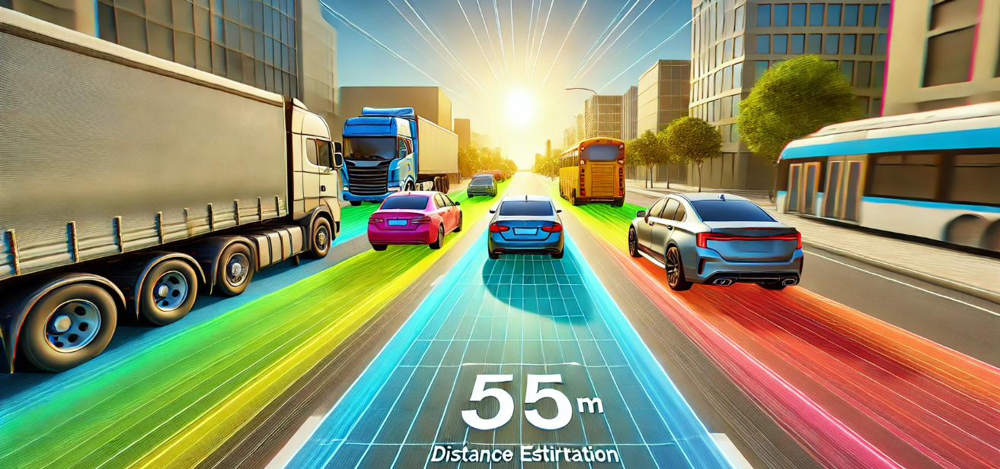
<br>
<font size="2pt"><i>image citation: DALLEDALL·E 2024

---

## **Project Overview**

This Jupyter Notebook script explores the KITTI 3D detection dataset. It displays images, visualizes bounding boxes, and overlays information extracted from the labels. Here’s what the script accomplishes:
- Reading image files and labels: The script uses the provided directories to load images and their corresponding labels.
- Displaying images: Loaded images are displayed using Matplotlib for verification.
- Reading and parsing labels: The script reads the 2D bounding box labels from the label files. It extracts relevant fields such as object class, bounding box coordinates (xmin, ymin, xmax, ymax), and annotation attributes.
- Overlaying bounding boxes: It draws the bounding boxes on the corresponding images using the extracted label information. Additionally, the image is overlaid with information such as the bounding box ID.
- Stereo camera image processing (Optional): If stereo images are provided, the script combines left and right images using weighted overlays to visualize stereo effects.


## **Dataset Information**

KITTI Dataset Source: The dataset used in this repository is part of the KITTI Vision Benchmark Suite, which was developed by Karlsruhe Institute of Technology and Toyota Technological Institute at Chicago. The dataset consists of left and right camera images, calibration files, and labeled ground truth data. You can download the dataset from the following links:

- Left Color Images (12 GB): <a href="https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_2.zip" target="_blank">Download here</a>
- Right Color Images (12 GB): <a href="https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_3.zip" target="_blank">Download here (Optional for stereo use)</a>
- Camera Calibration Files (16 MB): <a href="https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_calib.zip" target="_blank">Download here</a>
- Training Labels (5 MB): <a href="https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_label_2.zip" target="_blank">Download here</a>

In this repository, we are using a small subset of the dataset for demonstration purposes, focusing on 10 sample images.

In [ ]:
# !pip3 install tabulate

In [1]:
# Load libraries
import cv2
import matplotlib.pyplot as plt

from tabulate import tabulate

from app import app
from kitti.data import read_label_3d, get_image_names

### **Load Sample Image**
In this section, we are selecting a sample image from the KITTI dataset along with its corresponding calibration and label files. We then load and display the image using matplotlib, setting it up for further analysis of bounding box data. The figure size is adjusted to allow for better visibility of the details in the image.

Left Camera Image


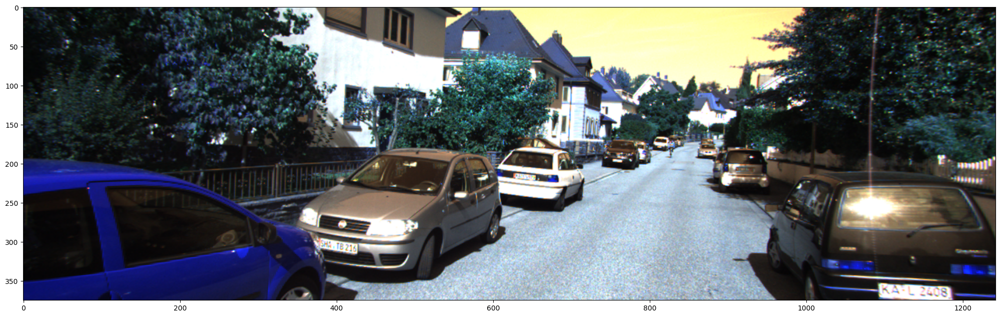

In [2]:
# Set the figure size for displaying images
plt.rcParams['figure.figsize'] = (25, 14)

# Retrieve the list of image filenames from the specified directory
# DataConfig:
# image_dir: 'data/detection/training/image_2/'
# label_dir: 'data/detection/training/label_2/'
# calibration_dir: 'data/detection/training/calib/'
      
image_names = get_image_names(app.DataConfig.image_dir)

# Select the 9th image in the dataset (index 8) for exploration
f = image_names[8]

# Define paths for the selected image, calibration file, and label file
image_file = app.DataConfig.image_dir + f
calibration_file = app.DataConfig.calibration_dir + f.replace('png', 'txt')
label_file = app.DataConfig.label_dir + f.replace('png', 'txt')

# Read the 3D bounding box labels from the label file
labels = read_label_3d(label_file)

# Load the image using OpenCV
img = cv2.imread(image_file)

# Display the image using matplotlib
print("Left Camera Image")
plt.imshow(img)

Right Camera Image


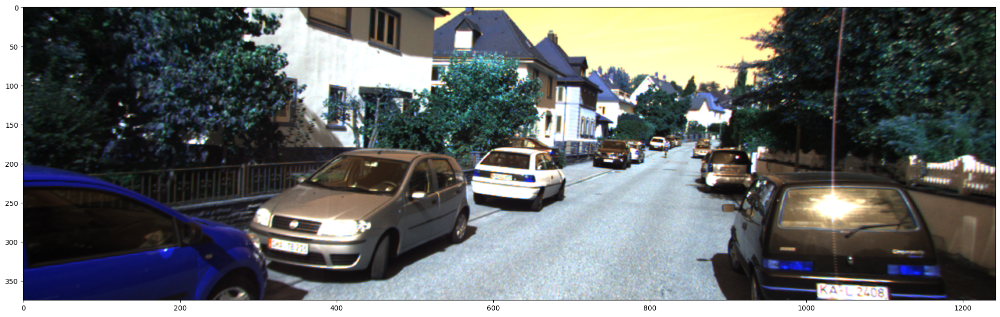

In [3]:
# Load the corresponding right stereo image by replacing 'image_2' with 'image_3' in the file path
img3 = cv2.imread(image_file.replace('image_2', 'image_3'))

print("Right Camera Image")

# Display the right stereo image using matplotlib
plt.imshow(img3)

### **Overlaying Images of Left and Right Camera**

In this step, we overlay the left and right stereo images using equal transparency weights. This combined view helps in visualizing both perspectives simultaneously, which can provide a richer spatial context for understanding object positions and bounding boxes. The blended image can be useful for depth perception tasks.

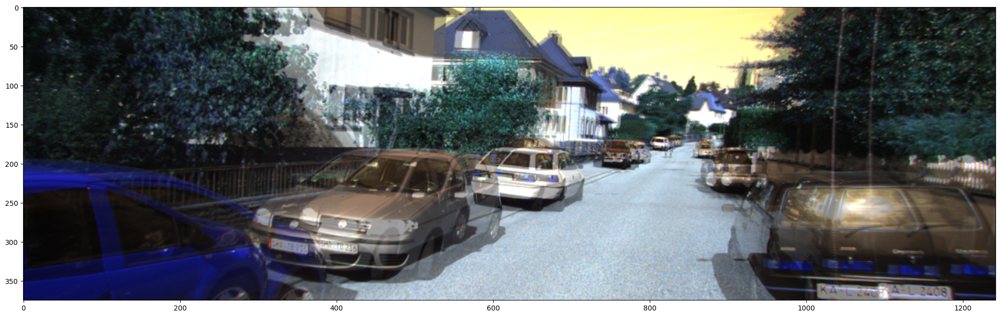

In [4]:
# Combine the left and right stereo images with equal weight (0.5 each) to create an overlay effect
combined = cv2.addWeighted(img, 0.5, img3, 0.5, 0)

# Display the combined overlay of left and right images
plt.imshow(combined)

### **The Label Files**

In this step, we read and display the contents of the label file, which contains annotations for each object detected in the scene. Each line provides information on object type, bounding box coordinates, 3D dimensions, position in camera coordinates, and additional details such as truncation and occlusion levels.

For instance:
- Each "Car" entry includes bounding box information and the zloc (distance along the Z-axis in camera coordinates), helping us estimate the distance of each object.
- "DontCare" entries specify regions that should be ignored in evaluation.

This detailed annotation data is essential for training and evaluating our model, as it includes ground truth for object locations and dimensions.

In [5]:
label_file

'data/detection/training/label_2/000008.txt'

In [6]:
# Open and display the contents of the label file, which contains object annotations for the image
with open(label_file, 'r') as file:
    print(file.read())

Car 0.88 3 -0.69 0.00 192.37 402.31 374.00 1.60 1.57 3.23 -2.70 1.74 3.68 -1.29
Car 0.00 1 2.04 334.85 178.94 624.50 372.04 1.57 1.50 3.68 -1.17 1.65 7.86 1.90
Car 0.34 3 -1.84 937.29 197.39 1241.00 374.00 1.39 1.44 3.08 3.81 1.64 6.15 -1.31
Car 0.00 1 -1.33 597.59 176.18 720.90 261.14 1.47 1.60 3.66 1.07 1.55 14.44 -1.25
Car 0.00 0 1.74 741.18 168.83 792.25 208.43 1.70 1.63 4.08 7.24 1.55 33.20 1.95
Car 0.00 0 -1.65 884.52 178.31 956.41 240.18 1.59 1.59 2.47 8.48 1.75 19.96 -1.25
DontCare -1 -1 -10 800.38 163.67 825.45 184.07 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 859.58 172.34 886.26 194.51 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 801.81 163.96 825.20 183.59 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 826.87 162.28 845.84 178.86 -1 -1 -1 -1000 -1000 -1000 -10



In [7]:
print(tabulate(labels, headers='keys'))

    label       truncated    occluded    alpha    bbox_xmin    bbox_ymin    bbox_xmax    bbox_ymax    dim_height    dim_width    dim_length     loc_x     loc_y     loc_z    rotation_y    score
--  --------  -----------  ----------  -------  -----------  -----------  -----------  -----------  ------------  -----------  ------------  --------  --------  --------  ------------  -------
 0  Car              0.88           3    -0.69         0          192.37       402.31       374             1.6          1.57          3.23     -2.7       1.74      3.68         -1.29      nan
 1  Car              0              1     2.04       334.85       178.94       624.5        372.04          1.57         1.5           3.68     -1.17      1.65      7.86          1.9       nan
 2  Car              0.34           3    -1.84       937.29       197.39      1241          374             1.39         1.44          3.08      3.81      1.64      6.15         -1.31      nan
 3  Car              0             

- label: The type of detected object, such as 'Car,' 'Pedestrian,' 'Truck,' etc.
- truncated: A float value from 0 (not truncated) to 1 (fully truncated). This indicates how much of the object is cut off by the image boundaries.
- occluded: An integer representing the occlusion state of the object:
0 = fully visible
1 = partly occluded
2 = largely occluded
3 = unknown
- alpha: The observation angle of the object in the image, ranging from -π to π. This represents the angle between the viewing direction and the object’s orientation.
- bbox_xmin: The x-coordinate of the top-left corner of the bounding box around the object in the 2D image.
- bbox_ymin: The y-coordinate of the top-left corner of the bounding box around the object in the 2D image.
- bbox_xmax: The x-coordinate of the bottom-right corner of the bounding box around the object in the 2D image.
- bbox_ymax: The y-coordinate of the bottom-right corner of the bounding box around the object in the 2D image.
- dim_height: The height of the object in meters.
- dim_width: The width of the object in meters.
- dim_length: The length of the object in meters.
- loc_x: The x-coordinate of the object’s location in 3D space relative to the camera, in meters.
- loc_y: The y-coordinate of the object’s location in 3D space relative to the camera, in meters.
- loc_z: The z-coordinate of the object’s location in 3D space relative to the camera, in meters. This represents the distance from the camera to the object.
- rotation_y: The rotation angle of the object around the y-axis in camera coordinates, ranging from -π to π. It represents the orientation of the object in 3D space.
- score: A float representing the confidence score of the detection, where a higher score indicates higher confidence. (Only used for detection results; may be omitted in ground truth data.)

## **Exploring 2D Labels**

In this code, we extract the bounding box coordinates from the labels DataFrame, which contain the pixel values defining the bounding box around each detected object. Only columns with names starting with 'bbox' are selected, and they are converted to integer format for accuracy and easier manipulation. Displaying the first few rows gives us a quick overview of the bounding box data for the detected objects in the image. This data is crucial for drawing and visualizing the bounding boxes on the images.

In [8]:
# Extract columns from the labels DataFrame that represent bounding box coordinates
# The columns start with 'bbox' (e.g., bbox_xmin, bbox_ymin, bbox_xmax, bbox_ymax).
# Convert these values to integers for further processing and display the first few rows.
coordinates = labels[[col for col in labels.columns if col.startswith('bbox')]].astype(int)
coordinates.head()

,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax
0,0,192,402,374
1,334,178,624,372
2,937,197,1241,374
3,597,176,720,261
4,741,168,792,208


In [9]:
# Calculate the four corner coordinates of each bounding box
# For each row in the coordinates DataFrame, use the bounding box values (xmin, ymin, xmax, ymax)
# to define the corners of the bounding box as tuples.
# Each bounding box is represented by four corners: top-left, bottom-left, top-right, and bottom-right.
corners = coordinates.apply(lambda x: ((x.bbox_xmin, x.bbox_ymin), 
                                       (x.bbox_xmin, x.bbox_ymax), 
                                       (x.bbox_xmax, x.bbox_ymin), 
                                       (x.bbox_xmax, x.bbox_ymax)), axis=1)

# Display the first few rows to check the calculated corner coordinates for each bounding box.
corners.head()

0         ((0, 192), (0, 374), (402, 192), (402, 374))
1     ((334, 178), (334, 372), (624, 178), (624, 372))
2    ((937, 197), (937, 374), (1241, 197), (1241, 3...
3     ((597, 176), (597, 261), (720, 176), (720, 261))
4     ((741, 168), (741, 208), (792, 168), (792, 208))
dtype: object

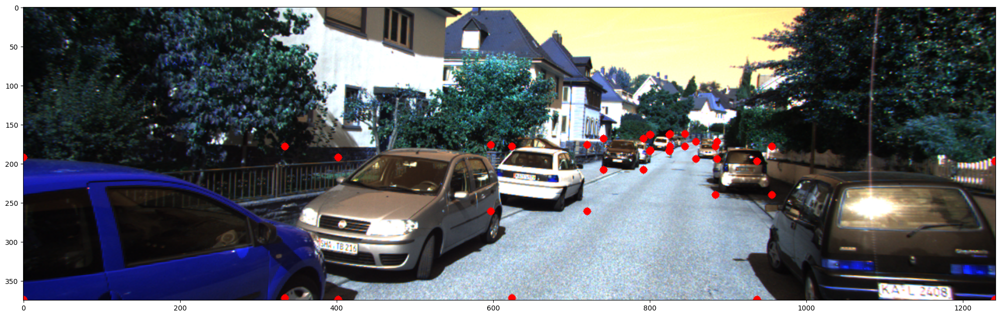

In [11]:
# Draw circles on each corner of the bounding boxes in the image
# For each bounding box (represented by `box` in the `corners` DataFrame),
# iterate over each corner coordinate (top-left, bottom-left, top-right, bottom-right).
# Draw a small circle at each corner on the `img` with a blue color (255, 0, 0), 
# radius of 1, and thickness of 5 for easy visualization.
for box in corners:
    for corner in box:
        cv2.circle(img, corner, 2, (255, 0, 0), 5)  # Draw circle on each corner

# Display the modified image with the corners of bounding boxes marked
plt.imshow(img)

In [12]:
# Select and display specific columns from the labels DataFrame:
# - The 'label' column, which contains the type of object detected (e.g., Car, Pedestrian).
# - All columns that contain bounding box coordinates, identified by columns that start with 'bbox'.
# This helps in examining the object labels alongside their bounding box coordinates.
labels[['label'] + [col for col in labels.columns if col.startswith('bbox')]]

,label,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax
0,Car,0.00,192.37,402.31,374.00
1,Car,334.85,178.94,624.50,372.04
2,Car,937.29,197.39,1241.00,374.00
3,Car,597.59,176.18,720.90,261.14
4,Car,741.18,168.83,792.25,208.43
5,Car,884.52,178.31,956.41,240.18
6,DontCare,800.38,163.67,825.45,184.07
7,DontCare,859.58,172.34,886.26,194.51
8,DontCare,801.81,163.96,825.20,183.59
9,DontCare,826.87,162.28,845.84,178.86


## **Drawing Bounding Boxes**

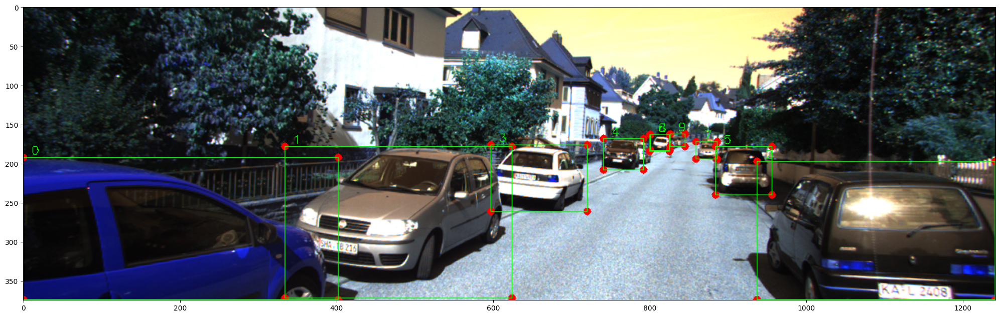

In [13]:
# Extract bounding box coordinates from the labels DataFrame and draw them on the image:
# - For each row in `labels`, define the top-left (bbox_xmin, bbox_ymin) and bottom-right (bbox_xmax, bbox_ymax) coordinates of the bounding box.
# - Draw a green rectangle on the image using these bounding box coordinates.
# - Add a label index (i) near each bounding box for easy identification, placing the label slightly above the top-left corner of the box.
# - Display the modified image with the bounding boxes and labels.
boxes = labels.apply(lambda x: ((int(x.bbox_xmin), int(x.bbox_ymin)), (int(x.bbox_xmax), int(x.bbox_ymax))), axis=1)

for i, box in enumerate(boxes):
    img = cv2.rectangle(img, box[0], box[1], (0, 255, 0))  # Draw bounding box
    img = cv2.putText(img, str(i), (box[0][0] + 10, box[0][1] - 4), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)  # Add label index

plt.imshow(img)  # Display the image with bounding boxes and labels

## **Additional Information**

This project serves as an introductory experiment to visualize and process bounding boxes on the KITTI dataset using Python and common computer vision libraries. Further work can include:

- Advanced Object Detection: Using pre-trained models like YOLO or Faster R-CNN to detect objects.
- Depth Estimation: Working with stereo images to estimate depth information.
- Performance Metrics: Measuring detection accuracy using metrics like Intersection over Union (IoU).

Feel free to explore the provided scripts, modify them to suit your needs, and contribute back to this repository with your findings or improvements!

## **Acknowledgments**

This project uses the KITTI Vision Benchmark Suite dataset. We thank the Karlsruhe Institute of Technology and Toyota Technological Institute at Chicago for providing the dataset. More information about the dataset can be found on the KITTI Dataset website.

Happy experimenting with KITTI! 🚗